We start by adding the necessary folders to the current working path.

In [1]:
# import sys/os
import sys, os

# get current directory
path = os.getcwd()

# get parent directory
parent_directory = os.path.sep.join(path.split(os.path.sep)[:-4])

# add utils folder to current working path
sys.path.append(parent_directory+"/subfunctions/utils")

# add integration folder to current working path
sys.path.append(parent_directory+"/subfunctions/integration")

# add FTLE folder to current working path
sys.path.append(parent_directory+"/demos/AdvectiveBarriers/FTLE2D")

# add PRA folder to current working path
sys.path.append(parent_directory+"/demos/AdvectiveBarriers/PRA2D")

# add LAVD folder to current working path
sys.path.append(parent_directory+"/demos/AdvectiveBarriers/LAVD2D")

# add HyperbolicsOECS folder to current working path
sys.path.append(parent_directory+"/demos/AdvectiveBarriers/HyperbolicOECS")

# add ActiveBarriers folder to current working path
sys.path.append(parent_directory+"/demos/ActiveBarriers")

# Overview

We illustrate the numerical implementation and the use of the active Finite Time Lyapunov Exponent (aFTLE), active Polar Rotation Angle (aPRA) on oceanographic data (AVISO). 

Note: The AVISO data does not satisfy the Navier-Stokes equations and hence the barrier equations derived for Navier-Stokes are actually not valid here. Nevertheless, I still compute the structures as if the velocity field were to satisfy Navier-Stokes equations. In case you have an ocean velocity field which satisfies the Navier-

The LCS diagnostics (FTLE/PRA) are applied to the two-dimensional and steady instantaneous vorticity barrier equations derived from the Navier-Stokes equations. The notebook is structured as follows:

1. Import velocity and SSH data stored in the folder 'data/Aviso'. Make sure that all the necessary files are stored in the folder 'data/Aviso'.
2. Define computational parameters (such as the number of cores) and data.
3. Define spatio-temporal domain.
4. Interpolate velocity from (discrete) gridded data.
5. Instantaneous linear momentum barriers from active Finite Time Lyapunov Exponent ($\mathrm{aFTLE}$) and active Polar Rotation Angle ($\mathrm{aPRA}$):
   
   For 2D incompressible, uniform-density Navier–Stokes flows, the Eulerian barrier equation for vorticity is an autonomous Hamiltonian system of the form:
   
    \begin{equation}
        \mathbf{x}'(s)=\nu \rho \mathbf{J} \nabla \dfrac{D}{Dt}\mathbf{\omega_z (\mathbf{x}}, t), \label{eq: vorticity} \tag{1}
    \end{equation}
   
   where $ \mathbf{\omega}_z(\mathbf{x}, t) $ denotes the z-component of the vorticity field.
   
   Time 't' is just a fixed parameter and hence the system is autonomous and the integration is done with respect to a dummy time variable 's'. 's' can be arbitrarily large and the $\mathrm{aFTLE}/\mathrm{aPRA}$ is only limited by the spatial resolution and domain. It can thus potentially reveal finer and more resolved structures compared to the classic version of the $\mathrm{FTLE}/\mathrm{PRA}$, which is fundamentally limited by the temporal domain of the available data.
    
   We start by evaluating the right-hand-side of equation \ref{eq: vorticity} by interpolating $ \nabla \mathbf{\omega}(\mathbf{x}, t) $ over the spatial meshgrid.
   
   We then apply the $\mathrm{aFTLE}/\mathrm{aPRA}$ to the autonomous ODE from equation \ref{eq: vorticity} over different dummy time-intervals. We additionally compare the results with the classic instantaneous $\mathrm{FTLE}$-field.
   
6. References

# Import data

We start by importing the velocity and SSH data from the files located in the folder 'data/Aviso'.

In [2]:
# import scipy
import scipy.io as sio

import numpy as np

# Import velocity data from file in data-folder
mat_file = sio.loadmat('../../../../data/Aviso/AVISO.mat')

U = mat_file['u'] # array (NY, NX, NT)
V = mat_file['v'] # array (NY, NX, NT)
x = mat_file['x'] # array (NY, NX)
y = mat_file['y'] # array (NY, NX)
time_data = mat_file['t'].reshape(1, -1) # array (1, NT)

In [3]:
import netCDF4 as nc

ssh_file = nc.Dataset('SSH_AVISO.nc')

SSH = ssh_file['sla'][:]
y_SSH = ssh_file['latitude'][:]
x_SSH = ssh_file['longitude'][:]

SSH = np.moveaxis(SSH, 0, -1)

# Computational parameters and data

Here we define the computational parameters and the data.

In [4]:
# import numpy
import numpy as np

# Number of cores for parallel computing
Ncores = 16 # int >= 1

# Time resolution of data
dt_data = time_data[0, 1]-time_data[0,0] # float

# Periodic boundary conditions
periodic_x = False # bool
periodic_y = False # bool
periodic_t = False # bool
periodic = [periodic_x, periodic_y, periodic_t]

# Unsteady velocity field
bool_unsteady = True # bool

# Defined domain
defined_domain = np.isfinite(U[:,:,0]).astype(int) # array (NY, NX)

## Compute meshgrid of dataset
X, Y = np.meshgrid(x, y) # array (NY, NX), array (NY, NX)

## Resolution of meshgrid
dx_data = X[0,1]-X[0,0] # float
dy_data = Y[1,0]-Y[0,0] # float

delta = [dx_data, dy_data] # list (2, )

NY = U.shape[0]
NX = U.shape[1]
NT = time_data.shape[-1]

# Spatio-temporal domain

Here we define the spatio-temporal domain over which to consider the dynamical system.

In [5]:
# Longitudinal and latitudinal boundaries (in degrees)
xmin = 2 # float
xmax = 7 # float
ymin = -35 # float
ymax = -30 # float

# init time index
t0 = 3

# NOTE: This time-interval is specified in case you want to compute trajectories at some point in the script.
# It is now set for computing trajectories over 7 days
tN = t0 + 7
time = np.linspace(t0, tN, 50)

# make sure that domain is part of the data domain.
assert np.min(X) <= xmin <= np.max(X), " xmin must be between "+f'{np.min(X)} and {np.max(X)}'
assert np.min(X) <= xmax <= np.max(X), " xmax must be between "+f'{np.min(X)} and {np.max(X)}'
assert np.min(Y) <= ymin <= np.max(Y), " ymin must be between "+f'{np.min(Y)} and {np.max(Y)}'
assert np.min(Y) <= ymax <= np.max(Y), " ymax must be between "+f'{np.min(Y)} and {np.max(Y)}'

# Spacing of meshgrid (in degrees)
dx = 0.025 # float
dy = 0.025 # float

x_domain = np.arange(xmin, xmax + dx, dx) # array (Nx, )
y_domain = np.arange(ymin, ymax + dy, dy) # array (Ny, )

X_domain, Y_domain = np.meshgrid(x_domain, y_domain) # array (Ny, Nx)

Ny = X_domain.shape[0] # int
Nx = X_domain.shape[1] # int

# Define ratio of auxiliary grid spacing vs original grid_spacing
aux_grid_ratio = .01 # float between [1/5, 1/10]
aux_grid = [aux_grid_ratio*(X_domain[0, 1]-X_domain[0, 0]), aux_grid_ratio*(Y_domain[1, 0]-Y_domain[0, 0])]

# define dummy time interval
ds = 0.005
sN = 3 # Feel free to change this parameter as needed
s_dummy = np.arange(0, sN+ds, ds)

# Interpolate velocity

In order to evaluate the velocity field at arbitrary locations and times, we interpolate the discrete velocity data. The interpolation with respect to time is always linear. The interpolation with respect to space can be chosen to be "cubic" or "linear".

In [6]:
# Import interpolation function for unsteady flow field
from ipynb.fs.defs.Interpolant import interpolant_unsteady

# Set nan values to zero (in case there are any) so that we can apply interpolant. 
# Interpolant does not work if the array contains nan values. 
U[np.isnan(U)] = 0
V[np.isnan(V)] = 0

# Interpolate velocity data using cubic spatial interpolation
Interpolant = interpolant_unsteady(X, Y, U, V, method = "cubic")

Interpolant_u = Interpolant[0]
Interpolant_v = Interpolant[1]

SSH[np.isnan(SSH)] = 0

X_SSH, Y_SSH = np.meshgrid(x_SSH, y_SSH)

# Interpolate SSH field using cubic spatial interpolation
Interpolant_SSH = interpolant_unsteady(X_SSH, Y_SSH, SSH, SSH, method = "cubic")[0]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

# Instantaneous vorticity barriers from active Finite Time Lyapunov Exponent ($\mathrm{aFTLE}$)

We visualize vorticity barriers by applying the $ \mathrm{FTLE} $-field to the trajectories of the vorticity barrier equation . As soon as the FTLE-field is applied to an active vector field, such as vorticity, we refer to it as $ \mathrm{aFTLE} $ (active $ \mathrm{FTLE} $). We will subsequently compare the results with the classic version of the instantaneous $ \mathrm{FTLE} $-field which is given by the maximum eigenvalue of the rate of strain tensor.

## Interpolate instantaneous vorticity barrier field

We start by computing the interpolant for the instantaneous vorticity barrier field. The interpolant is given by the right-hand-side of instantaneous vorticity barrier equation.

In [7]:
# Import function to compute gradient of velocity
from ipynb.fs.defs.gradient_velocity import gradient_velocity

# Import function to compute velocity
from ipynb.fs.defs.velocity import velocity

# Import function to check particle location
from ipynb.fs.defs.check_location import check_location

# Import package for parallel computing
from joblib import Parallel, delayed

from tqdm.notebook import tqdm

# Vectorize initial conditions
x0 = X.ravel() # array (Ny*Nx, )
y0 = Y.ravel() # array (Ny*Nx, )
        
omega = np.zeros((NY, NX, NT))

idx_t = 0

# Compute gradient of velocity field
for t in tqdm(time_data[0,:]):
    
    grad_vel = gradient_velocity(t, np.array([x0, y0]).reshape(2,-1), X, Y, Interpolant_u, Interpolant_v, periodic, defined_domain, bool_unsteady, time_data, delta, aux_grid) # (2,2,Nx*Ny)
    
    # Compute spin tensor
    W = .5*(grad_vel-grad_vel.transpose(1,0,2))  # array (2, 2, Ny*Nx)
    
    W_domain = np.array(W)[0,1,:].reshape(NY, NX)
    
    omega[:,:,idx_t] = 2*np.array(W_domain)

    idx_t += 1

  0%|          | 0/92 [00:00<?, ?it/s]

This function computes the interpolant for the instantaneous vorticity barrier equation:

\begin{equation}
 \mathbf{x}'=\nu \rho \mathbf{J} \nabla \dfrac{D}{Dt}\hat{\omega} (\mathbf{x}, t), \label{eq: barriereq} \tag{2}
\end{equation}

where $ \nu $ is the viscosity, $ \rho $ the density of the fluid, $ \mathbf{J} = \begin{pmatrix} 0 && 1 \\ -1 && 0 \end{pmatrix} $ and $ \hat{\omega} $ is the scalar valued vorticity in 2D.
 
 For simplicity we can normalize equation $ \ref{eq: barriereq} $ by $ \nu $ and $ \rho $ and thus simply omit them as they play no role when exploring the structures of the field $ \mathbf{x'} $.
 
 We compute $ \mathbf{\nabla}\dfrac{D}{Dt}\hat{\omega}(\mathbf{x},t) $ by advecting the trajectory starting at $ \mathbf{x} $ over a very short segment in order to compute the acceleration of the particle at time 't'. From there we can then evalute the right hand side of equation \ref{eq: vorticity} according to:
 
 \begin{equation}
 \nabla \dfrac{D}{Dt}\hat{\omega}(\mathbf{x},t) = \nabla \dfrac{D}{Dt} (\nabla \times \mathbf{u}) = \nabla (\nabla \times \dfrac{D}{Dt} \mathbf{u}) = \nabla (\nabla \times \mathbf{a}) \tag{3},
 \end{equation} where $ \mathbf{a} $ is the acceleration and $ \mathbf{u} $ is the velocity.

In [8]:
# Import interpolation function for instantaneous active vorticity barrier equation
from ipynb.fs.defs.InstantaneousActiveVorticity import InstantaneousActiveVorticity

print("Computation of Interpolant for Eulerian vorticity barrier equations: Started...")

# Interpolate RHS of vorticity barrier equation using cubic spline interpolation
Interpolant_vorticity = InstantaneousActiveVorticity(t0, X, Y, Interpolant_u, Interpolant_v, periodic, defined_domain, bool_unsteady, time_data, aux_grid, Ncores, verbose = True)

print("Computation of Interpolant for Eulerian vorticity barrier equations: Done")

Computation of Interpolant for Eulerian vorticity barrier equations: Started...
Percentage completed:  0.0
Percentage completed:  95.24
Computation of Interpolant for Eulerian vorticity barrier equations: Done


## Compute Flow map and Gradient of the Flow map

In [9]:
# Import function to compute gradient of flow map
from ipynb.fs.defs.gradient_flowmap import gradient_flowmap

# Import function to compute flow map (=trajectories) and derivative of flow map (=velocity along trajectories)
from ipynb.fs.defs.integration_dFdt import integration_dFdt

# Import package for parallel computing
from joblib import Parallel, delayed

# Split x0, y0 into 'Ncores' equal batches for parallel computing
def split(a, n):
    k, m = divmod(len(a), n)
    return (a[i*k+min(i, m):(i+1)*k+min(i+1, m)] for i in range(n))

# Split x0,y0,z0 into 'Ncores' equal batches for parallel computing
def split_last_dimension(a, n):
    a = a.transpose()
    k, m = divmod(len(a), n)
    
    return (a[i*k+min(i, m):(i+1)*k+min(i+1, m)].transpose() for i in range(n))

def parallel_Fmap(x0_batch, y0_batch):
    
    print("Computation of flow map: Started")
    
    X0 = np.array([x0_batch, y0_batch]).reshape(2,-1) # array (2, Nx*Ny)
    
    Fmap = integration_dFdt(time, X0, X, Y, Interpolant_u, Interpolant_v, periodic, True, time_data.reshape(1,-1), verbose=True)[0] # array (Nt, 2, Nx*Ny)
    
    print("Computation of flow map: Done")
    
    return Fmap

def parallel_grad_Fmap(x0_batch, y0_batch):
    
    # Initial conditions
    X0 = np.array([x0_batch, y0_batch]) # array (2, Nx*Ny)
    
    print("Computation of gradient of flow map: Started")

    # Compute gradient of flow map
    DF = gradient_flowmap(s_dummy, X0, X, Y, Interpolant_vorticity[0], Interpolant_vorticity[1], periodic, defined_domain, False, s_dummy.reshape(1,-1), aux_grid, verbose=False) # array (Nt, 2, 2, Nx*Ny)

    print("Computation of gradient of flow map: Done")
    
    return DF

# Vectorize initial conditions by arranging them to a vector of size (Nx*Ny, )
x0 = X_domain.ravel() # array (Nx*Ny,)
y0 = Y_domain.ravel() # array (Nx*Ny,)

x0_batch = list(split(x0, Ncores)) # list (Nx*Ny)
y0_batch = list(split(y0, Ncores)) # list (Nx*Ny)

results = Parallel(n_jobs=Ncores, verbose = 50)(delayed(parallel_grad_Fmap)(x0_batch[i], y0_batch[i]) for i in range(len(x0_batch)))

# Extract gradient flow map from results of parallel computing
grad_Fmap = results[0]

for res in results[1:]:
    grad_Fmap = np.append(grad_Fmap, res, axis = -1)
    
grad_Fmap_domain = grad_Fmap.reshape(grad_Fmap.shape[0], 2, 2, Ny, Nx)

# Here we compute trajectories over the time-interval [t0, tN]. These trajectories are NOT needed in order to compute the active diagnostics.
# I just included this part here in case at some point you want visualize a bunch of trajectories to verify the impact of the
# structures on the particle behaviour.
results = Parallel(n_jobs=Ncores, verbose = 50)(delayed(parallel_Fmap)(x0_batch[i], y0_batch[i]) for i in range(len(x0_batch)))

# Extract gradient flow map from results of parallel computing
Fmap = results[0]

for res in results[1:]:
    Fmap = np.append(Fmap, res, axis = -1)
    
Fmap_domain = Fmap.reshape(Fmap.shape[0], 2, Ny, Nx)

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:  2.3min
[Parallel(n_jobs=16)]: Done   2 out of  16 | elapsed:  2.3min remaining: 16.4min
[Parallel(n_jobs=16)]: Done   3 out of  16 | elapsed:  2.4min remaining: 10.2min
[Parallel(n_jobs=16)]: Done   4 out of  16 | elapsed:  2.4min remaining:  7.2min
[Parallel(n_jobs=16)]: Done   5 out of  16 | elapsed:  2.5min remaining:  5.5min
[Parallel(n_jobs=16)]: Done   6 out of  16 | elapsed:  2.5min remaining:  4.2min
[Parallel(n_jobs=16)]: Done   7 out of  16 | elapsed:  2.5min remaining:  3.3min
[Parallel(n_jobs=16)]: Done   8 out of  16 | elapsed:  2.5min remaining:  2.5min
[Parallel(n_jobs=16)]: Done   9 out of  16 | elapsed:  2.6min remaining:  2.0min
[Parallel(n_jobs=16)]: Done  10 out of  16 | elapsed:  2.6min remaining:  1.5min
[Parallel(n_jobs=16)]: Done  11 out of  16 | elapsed:  2.6min remaining:  1.2min
[Parallel(n_jobs=16)]: Done  12 out of  16 | elapse

## Compute active FTLE

We now compute the active $ \mathrm{FTLE} $ for the instantaneous linear momentum barrier equations. First, we evaluate the gradient of the active flow map over the meshgrid. The active flow map is given by the solution of the autonomous ODE from equation \ref{eq: linearmoment}. Finally, we apply the classic $ \mathrm{FTLE} $ to the gradient of the active flow map.

In [10]:
# Import function to compute gradient of flow map
from ipynb.fs.defs.gradient_flowmap import gradient_flowmap

# Import function to compute finite time Lyapunov exponent (FTLE)
from ipynb.fs.defs.FTLE import _FTLE

# Import package for parallel computing
from joblib import Parallel, delayed

# Split x0, y0 into 'Ncores' equal batches for parallel computing
def split(a, n):
    k, m = divmod(len(a), n)
    return (a[i*k+min(i, m):(i+1)*k+min(i+1, m)] for i in range(n))

def parallel_aFTLE(grad_Fmap, s_dummy, s, verbose):
    
    aFTLE = np.zeros((len(s), grad_Fmap.shape[-1]))
    
    print("Computation of aFTLE from gradient of flow map: Started...")
    
    counter = 0
    for idx in np.searchsorted(s_dummy, s):
        
        # Extract gradient from s0 to si
        DF_s0_si = grad_Fmap[idx,:, :, :] # array (Nt, 2, 2, Nx*Ny)
        
        for i in range(grad_Fmap.shape[3]):
            
            if verbose and i%100:
                print("Percentage completed: ", np.around((counter+1)*np.around(i/grad_Fmap.shape[3],4)*100/3, 4))
            
            # Compute active FTLE
            aFTLE[counter, i] = _FTLE(DF_s0_si[:,:,i], s_dummy[idx])
            
        counter += 1
    
    print("Computation of aFTLE: Done")
    
    return aFTLE

In [11]:
# Define dummy time-intervals for computation of aFTLE
s1 = 1
s2 = 2
s3 = 3

s = [s1, s2, s3]

# Vectorize initial conditions by arranging them to a vector of size (Nx*Ny, )
grad_Fmap_batch = list(split_last_dimension(grad_Fmap, Ncores)) # list (Nx*Ny*Nz)

results = Parallel(n_jobs=Ncores, verbose = 50)(delayed(parallel_aFTLE)(grad_Fmap_batch[i], s_dummy, s, verbose=True) for i in range(len(grad_Fmap_batch)))

# Extract FTLE from results of parallel computing
aFTLE = results[0]

for res in results[1:]:
    aFTLE = np.append(aFTLE, res, axis = 1)

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    8.5s
[Parallel(n_jobs=16)]: Done   2 out of  16 | elapsed:   11.6s remaining:  1.3min
[Parallel(n_jobs=16)]: Done   3 out of  16 | elapsed:   12.3s remaining:   53.1s
[Parallel(n_jobs=16)]: Done   4 out of  16 | elapsed:   14.8s remaining:   44.5s
[Parallel(n_jobs=16)]: Done   5 out of  16 | elapsed:   16.7s remaining:   36.7s
[Parallel(n_jobs=16)]: Done   6 out of  16 | elapsed:   18.4s remaining:   30.7s
[Parallel(n_jobs=16)]: Done   7 out of  16 | elapsed:   20.2s remaining:   26.0s
[Parallel(n_jobs=16)]: Done   8 out of  16 | elapsed:   21.4s remaining:   21.4s
[Parallel(n_jobs=16)]: Done   9 out of  16 | elapsed:   23.1s remaining:   17.9s
[Parallel(n_jobs=16)]: Done  10 out of  16 | elapsed:   26.3s remaining:   15.8s
[Parallel(n_jobs=16)]: Done  11 out of  16 | elapsed:   26.8s remaining:   12.2s
[Parallel(n_jobs=16)]: Done  12 out of  16 | elapse

## Compute active PRA

We now compute the active PRA for the instantaneous linear momentum barrier equations. First, we evaluate the active Cauchy-Green strain tensor from the gradient of the active flow map over the meshgrid. The active flow map is given by the solution of the autonomous ODE from equation \ref{eq: linearmoment}. Finally, we apply the classic PRA to the active Cauchy-Green strain tensor.

In [12]:
# Import package to compute Polar Rotation Angle (PRA)
from ipynb.fs.defs.PRA import _PRA

def parallel_aPRA(grad_Fmap, s_dummy, s, verbose):
    
    aPRA = np.zeros((len(s), grad_Fmap.shape[-1]))
    
    print("Computation of aPRA from gradient of the flow map: Started...")
    
    counter = 0
    for idx in np.searchsorted(s_dummy, s):
        
        # Extract gradient from s0 to si
        DF_s0_si = grad_Fmap[idx,:, :, :] # array (Nt, 2, 2, Nx*Ny)
        
        for i in range(grad_Fmap.shape[3]):
            
            if verbose and i%100:
                print("Percentage completed: ", np.around((counter+1)*np.around(i/grad_Fmap.shape[3],4)*100/4, 4))
            
            # Compute active PRA
            aPRA[counter, i] = _PRA(DF_s0_si[:,:,i])
            
        counter += 1
    
    print("Computation of aPRA from gradient of the flow map: Done")
    
    return aPRA

# Vectorize initial conditions by arranging them to a vector of size (Nx*Ny, )
grad_Fmap_batch = list(split_last_dimension(grad_Fmap, Ncores)) # list (Nx*Ny*Nz)

results = Parallel(n_jobs=Ncores, verbose = 50)(delayed(parallel_aPRA)(grad_Fmap_batch[i], s_dummy, s, verbose=True) for i in range(len(grad_Fmap_batch)))

# Extract PRA from results of parallel computing
aPRA = results[0]

for res in results[1:]:
    aPRA = np.append(aPRA, res, axis = 1)

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    4.7s
[Parallel(n_jobs=16)]: Done   2 out of  16 | elapsed:    6.5s remaining:   45.4s
[Parallel(n_jobs=16)]: Done   3 out of  16 | elapsed:    6.9s remaining:   30.0s
[Parallel(n_jobs=16)]: Done   4 out of  16 | elapsed:    7.2s remaining:   21.7s
[Parallel(n_jobs=16)]: Done   5 out of  16 | elapsed:    7.2s remaining:   15.9s
[Parallel(n_jobs=16)]: Done   6 out of  16 | elapsed:    7.3s remaining:   12.2s
[Parallel(n_jobs=16)]: Done   7 out of  16 | elapsed:    7.8s remaining:   10.0s
[Parallel(n_jobs=16)]: Done   8 out of  16 | elapsed:    7.8s remaining:    7.8s
[Parallel(n_jobs=16)]: Done   9 out of  16 | elapsed:    8.2s remaining:    6.4s
[Parallel(n_jobs=16)]: Done  10 out of  16 | elapsed:    8.4s remaining:    5.0s
[Parallel(n_jobs=16)]: Done  11 out of  16 | elapsed:    8.6s remaining:    3.9s
[Parallel(n_jobs=16)]: Done  12 out of  16 | elapse

## Compute IVD

In [13]:
def compute_vorticity(t, x, X, Y, Interpolant_u, Interpolant_v, periodic, bool_unsteady, time_data, delta_data, aux_grid):
    
    # Import function to compute velocity
    from ipynb.fs.defs.velocity import velocity
    
    '''This function computes the gradient of the velocity-field by finite differencing on an auxiliary grid.

    Parameters:
        t: float, time
        x: array (2,Npoints),  vector of positions
        X: array (Ny, Nx), X-meshgrid
        Y: array (Ny, Nx), Y-meshgrid
        Interpolant_u: Interpolant object for u(x,t)
        Interpolant_v: Interpolant object for v(x,t)
        Interpolant_w: Interpolant object for w(x,t)
        periodic: list (2,), periodic[0]: periodicity in x
                             periodic[1]: periodicity in y
        bool_unsteady: bool, specifies if velocity field is unsteady/steady
        time_data: array(Nt, ), time spacing of the velocity data
        delta_data: list (2,), delta[0]: x-grid spacing of the velocity data
                          delta[1]: y-grid spacing of the velocity data
        aux_grid: float, ratio of auxiliary meshgrid to original meshgrid
        
    Returns:
        vorticity: array (2,2, Npoints),  gradient (Jacobian matrix) of the velocity field
    '''    
    x = x.reshape(2,-1)
    
    # define auxiliary grid spacing
    rho_x = aux_grid[0] # float
    rho_y = aux_grid[1] # float
    
    X0, XL, XR, XU, XD = [], [], [], [], []
    
    for i in range(x.shape[1]):
        
        xr = x[0, i] + rho_x # float
        xl = x[0, i] - rho_x # float 
         
        if periodic[0]:
            xr = xr%(X[0,-1]-X[0,0])+X[0,0] # float
            xl = xl%(X[0,-1]-X[0,0])+X[0,0] # float
        
        yu = x[1, i] + rho_y # float
        yd = x[1, i] - rho_y # float
        
        if periodic[1]:
            yu = yu%(Y[-1,0]-Y[0,0])+Y[0,0] # float
            yd = yd%(Y[-1,0]-Y[0,0])+Y[0,0] # float
    
        X0.append([x[0, i], x[1, i]])
        XL.append([xl, x[1, i]])
        XR.append([xr, x[1, i]])
        XU.append([x[0, i], yu])
        XD.append([x[0, i], yd])    
    
    X0 = np.array(X0).transpose()
    XL = np.array(XL).transpose()
    XR = np.array(XR).transpose()
    XU = np.array(XU).transpose()
    XD = np.array(XD).transpose()
    
    # velocity on the auxiliary meshgrid
    vLend = velocity(t, XL, X, Y, Interpolant_u, Interpolant_v, periodic, bool_unsteady, time_data)    
    vRend = velocity(t, XR, X, Y, Interpolant_u, Interpolant_v, periodic, bool_unsteady, time_data)     
    vDend = velocity(t, XD, X, Y, Interpolant_u, Interpolant_v, periodic, bool_unsteady, time_data)   
    vUend = velocity(t, XU, X, Y, Interpolant_u, Interpolant_v, periodic, bool_unsteady, time_data)
    
    vorticity = np.zeros((vLend.shape[1],))
    
    # compute gradient of velocity
    
    for i in range(X0.shape[1]):
        
        vorticity[i] = (vUend[0,i]-vDend[0,i])/(2*rho_y)-(vRend[1,i]-vLend[1,i])/(2*rho_x)
    
    return vorticity

In [14]:
IVD = np.zeros((Ny, Nx))

# Vectorize initial conditions by arranging them to a vector of size (Nx*Ny, )
x0 = X_domain.ravel() # array (Nx*Ny,)
y0 = Y_domain.ravel() # array (Nx*Ny,)

x0_batch = list(split(x0, Ncores)) # list (Nx*Ny)
y0_batch = list(split(y0, Ncores)) # list (Nx*Ny)

X0 = np.array([x0.ravel(), y0.ravel()]).reshape(2, -1)

omega_domain = compute_vorticity(t0, X0, X, Y, Interpolant_u, Interpolant_v, periodic, bool_unsteady, time_data, delta, aux_grid)

IVD = np.abs(omega_domain.reshape(Ny, Nx)-np.nanmean(omega_domain.ravel()))

In [15]:
# Import function to compute outermost vortex boundary according to [1]
from ipynb.fs.defs.find_outermost_contour import find_outermost_contour

# Minimum distance between local maxima in the LAVD field
distance = 0.5 # float >=0

# Resolution of IVD field when extracting contours
n = 200 # int

# Convexity deficiency
c_d = .5*10**(-2) # float > 0

# Reject local maxima below this threshold
loc_threshold = 0.1*np.max(IVD) # float >= 0

# Minimum length of vortex boundary
l_min = 0.2 # float >= 0

# find outermost contour satisfying the specifi conditions = estimated vortex boundary.
vortex = find_outermost_contour(X_domain, Y_domain, IVD, distance, n, c_d, l_min, loc_threshold, Ncores) # list containing vortex boundaries

  0%|          | 0/19 [00:00<?, ?it/s]

## Compute instantaneous (classic) FTLE-field 

The instananeous (classic) $ \mathrm{FTLE} $-field at time 't' is given by the maximum eigenvalue of the rate of strain tensor. The rate of strain tensor is computed from the gradient of the velocity field at time 't':

\begin{equation}
\mathbf{S}(\mathbf{x}, t) = \dfrac{1}{2}(\mathbf{\nabla v}(\mathbf{x}, t)+\mathbf{\nabla v}(\mathbf{x}, t)^T) \tag{4}
\end{equation}

### Maximum eigenvalue of rate of strain tensor 

The rate of strain tensor $ S(\mathbf{x}, t) $ at time $ t $ is computed by iterating over meshgrid. $ (\mathbf{x}, t) $ is computed from the gradient of the velocity field by using an auxiliary meshgrid.

In [16]:
# Import function to compute gradient of velocity function
from ipynb.fs.defs.gradient_velocity import gradient_velocity

# Import function to compute eigenvalues/eigenvectors
from ipynb.fs.defs.eigen import eigen

# Split x0, y0 into N (equal) batches for parallel computing
def split(a, n):
    k, m = divmod(len(a), n)
    return (a[i*k+min(i, m):(i+1)*k+min(i+1, m)] for i in range(n))

def parallel_S(x0_batch, y0_batch):
    
    # Initial conditions
    X0 = np.array([x0_batch, y0_batch])
        
    # Compute gradient of velocity field
    grad_vel = gradient_velocity(t0, X0, X, Y, Interpolant_u, Interpolant_v, periodic, defined_domain, bool_unsteady, time_data, delta, aux_grid) # (2,2,Nx*Ny)
    
    # Compute rate of strain tensor
    S = .5*(grad_vel+grad_vel.transpose(1,0,2))

    return S

In [17]:
# Vectorize initial conditions by arranging them to a vector of size (Nx*Ny, 2)
x0 = X_domain.ravel()
y0 = Y_domain.ravel()

x0_batch = list(split(x0, Ncores))
y0_batch = list(split(y0, Ncores))

results = Parallel(n_jobs=Ncores, verbose = 0)(delayed(parallel_S)(x0_batch[i], y0_batch[i]) for i in range(len(x0_batch)))

# Extract rate of strain tensor from results of parallel computation
S = results[0]

for res in results[1:]:
    
    S = np.append(S, res, axis = 2)
    
# Reshape array from vectorized form to structured meshgrid
S = S.reshape((2, 2, X_domain.shape[0], X_domain.shape[1]))

# iterate over meshgrid
inst_FTLE = X_domain.copy()*np.nan

for i in range(X_domain.shape[0]):
    
    for j in range(Y_domain.shape[1]):
        
        inst_FTLE[i, j] = eigen(S[:,:,i, j])[1]

In [18]:
# Import function to compute eigenvalues/eigenvectors
from ipynb.fs.defs.eigen import eigen

eig1 = S[0,0,:,:].copy()*np.nan
eig2 = S[0,0,:,:].copy()*np.nan
e1 = np.zeros((eig1.shape[0], eig1.shape[1], 2))
e2 = np.zeros((eig2.shape[0], eig2.shape[1], 2))

#iterate over meshgrid
for i in range(X_domain.shape[0]):
    
    for j in range(Y_domain.shape[1]):
            
        x = [X_domain[i,j], Y_domain[i, j]]
        
        # Compute eigenvalues of rate of strain
        eig1[i,j], eig2[i,j], e1[i,j,:], e2[i,j,:] = eigen(S[:,:,i,j])

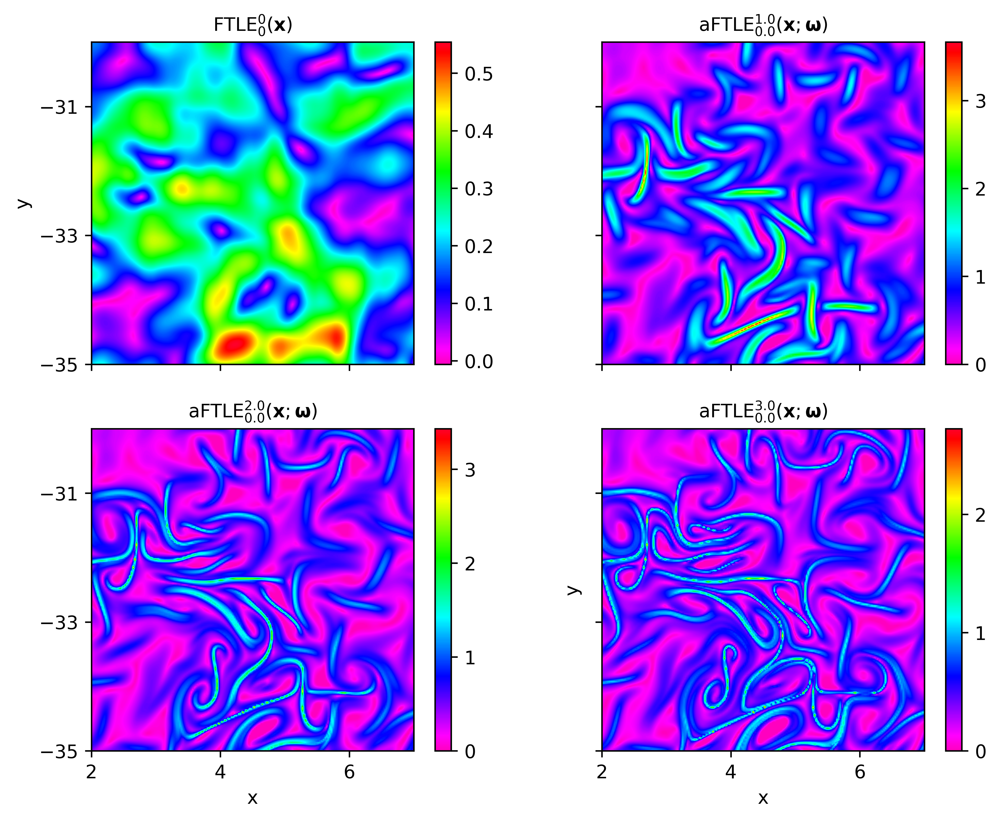

In [19]:
################################################ PLOT RESULTS ################################################

# Import plotting library
import matplotlib.pyplot as plt

# Plot legend
import matplotlib.patches as mpatches

cmapToUse = "gist_rainbow_r"

# Figure/Axis
fig, ax = plt.subplots(nrows=2, ncols=2, dpi = 600, figsize=(9, 7))

# Contourplot of instantaneous classic FTLE at time 't=0' over meshgrid of initial conditions
cax = ax[0,0].contourf(X_domain, Y_domain, inst_FTLE, cmap = cmapToUse, levels = 600)
# Colorbar
cbar = fig.colorbar(cax, ax = ax[0,0], ticks = np.linspace(0, 0.5, 6))

# Plot Elliptic OECS
# Contourplot of aFTLE_0^0.05 over meshgrid of initial conditions
cax = ax[0,1].tricontourf(x0, y0, aFTLE[0,:], cmap = cmapToUse, levels = 600)
# Colorbar
cbar = fig.colorbar(cax, ax = ax[0,1], ticks = np.arange(0, 10, 1, int))

# Plot Elliptic OECS
# Contourplot of aFTLE_0^0.15 over meshgrid of initial conditions
cax = ax[1,0].tricontourf(x0, y0, aFTLE[1,:], cmap = cmapToUse, levels = 600)
# Colorbar
cbar = fig.colorbar(cax, ax = ax[1,0], ticks = np.arange(0, 10, 1, int))

# Contourplot of aFTLE_0^0.25 over meshgrid of initial conditions
cax = ax[1,1].tricontourf(x0, y0, aFTLE[2,:], cmap = cmapToUse, levels = 600)
# Colorbar
cbar = fig.colorbar(cax, ax = ax[1,1], ticks = np.arange(0, 10, 1, int))

for i in range(ax.shape[0]):
    for j in range(ax.shape[1]):

        # Axis ticks
        ax[i,j].set_xticks(np.arange(np.min(x_domain), np.max(x_domain)+.1, 2))
        ax[i,j].set_yticks(np.arange(np.min(y_domain), np.max(y_domain)+.1, 2))
        ax[i,j].set_aspect("equal")

# Axis labels
ax[1,0].set_xlabel("x", fontsize = 10)
ax[1,1].set_xlabel("x", fontsize = 10)
ax[0,0].set_ylabel("y", fontsize = 10)
ax[1,1].set_ylabel("y", fontsize = 10)

ax[0,0].set_xticklabels([])
ax[0,1].set_xticklabels([])
ax[0,1].set_yticklabels([])
ax[1,1].set_yticklabels([])

ax[0,0].set_title(r'$\mathrm{FTLE}_{0}^{0}(\mathbf{x})$', fontsize = 10)
ax[0,1].set_title(r'$ \mathrm{aFTLE}$'+f'$_{{{np.around(s_dummy[0], 2)}}}^{{{np.around(s_dummy[np.searchsorted(s_dummy, s[0])], 2)}}}$'+r'($\mathbf{x}; \mathbf{\omega}$)', fontsize = 10)
ax[1,0].set_title(r'$ \mathrm{aFTLE}$'+f'$_{{{np.around(s_dummy[0], 2)}}}^{{{np.around(s_dummy[np.searchsorted(s_dummy, s[1])], 2)}}}$'+r'($\mathbf{x}; \mathbf{\omega}$)', fontsize = 10)
ax[1,1].set_title(r'$ \mathrm{aFTLE}$'+f'$_{{{np.around(s_dummy[0], 2)}}}^{{{np.around(s_dummy[np.searchsorted(s_dummy, s[2])], 2)}}}$'+r'($\mathbf{x}; \mathbf{\omega}$)', fontsize = 10)

plt.show()

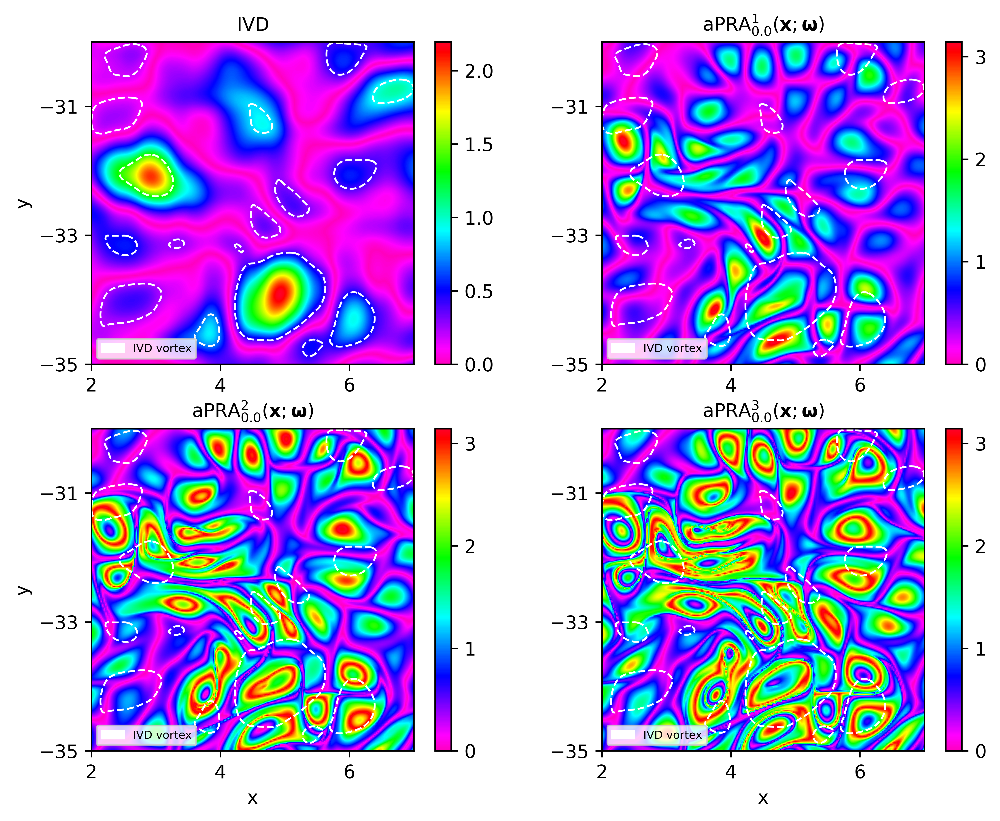

In [20]:
################################################ PLOT RESULTS ################################################

# Figure/Axis
fig, ax = plt.subplots(nrows=2, ncols=2, dpi = 600, figsize=(9, 7))

# Contourplot of IVD over meshgrid of initial conditions
cax = ax[0,0].tricontourf(x0, y0, IVD.ravel(), cmap = cmapToUse, levels = 600)
# Colorbar
cbar = fig.colorbar(cax, ax = ax[0,0], ticks = np.arange(0, 3, .5))

# Contourplot of aPRA_0^0.05 over meshgrid of initial conditions
cax = ax[0,1].tricontourf(x0, y0, aPRA[0,:], cmap = cmapToUse, levels = 600)
# Colorbar
cbar = fig.colorbar(cax, ax = ax[0,1], ticks = np.linspace(0, 3, 4))

# Contourplot of aPRA_0^0.15 over meshgrid of initial conditions
cax = ax[1,0].tricontourf(x0, y0, aPRA[1,:], cmap = cmapToUse, levels = 600)
# Colorbar
cbar = fig.colorbar(cax, ax = ax[1,0], ticks = np.linspace(0, 3, 4))

# Contourplot of aPRA_0^0.25 over meshgrid of initial conditions
cax = ax[1,1].tricontourf(x0, y0, aPRA[2,:], cmap = cmapToUse, levels = 600)
# Colorbar
cbar = fig.colorbar(cax, ax = ax[1,1], ticks = np.linspace(0, 3, 4))

IVD_vortices = mpatches.Patch(color='w', label='IVD vortex')

for i in range(ax.shape[0]):
    for j in range(ax.shape[1]):
        ax[i,j].set_xticks(np.arange(xmin, xmax+.1, 2))
        ax[i,j].set_yticks(np.arange(ymin, ymax+.1, 2))
        
        # plot vortex boundaries
        for v in vortex:
            ax[i,j].plot(v[0], v[1], c = "w", linestyle = "dashed", linewidth = 1)
        
        ax[i,j].set_aspect("equal")
        ax[i,j].legend(handles=[IVD_vortices], fontsize = 6,  loc = "lower left")

# Axis Labels
ax[1,0].set_xlabel("x", fontsize = 10)
ax[1,1].set_xlabel("x", fontsize = 10)
ax[0,0].set_ylabel("y", fontsize = 10)
ax[1,0].set_ylabel("y", fontsize = 10)

ax[0,0].set_title(r'$ \mathrm{IVD}$', fontsize = 10)
ax[0,1].set_title(r'$ \mathrm{aPRA}$'+f'$_{{{np.around(s_dummy[0], 2)}}}^{{{np.around(s[0], 2)}}}$'+r'($\mathbf{x}; \mathbf{\omega}$)', fontsize = 10)
ax[1,0].set_title(r'$ \mathrm{aPRA}$'+f'$_{{{np.around(s_dummy[0], 2)}}}^{{{np.around(s[1], 2)}}}$'+r'($\mathbf{x}; \mathbf{\omega}$)', fontsize = 10)
ax[1,1].set_title(r'$ \mathrm{aPRA}$'+f'$_{{{np.around(s_dummy[0], 2)}}}^{{{np.around(s[2], 2)}}}$'+r'($\mathbf{x}; \mathbf{\omega}$)', fontsize = 10)

plt.show()

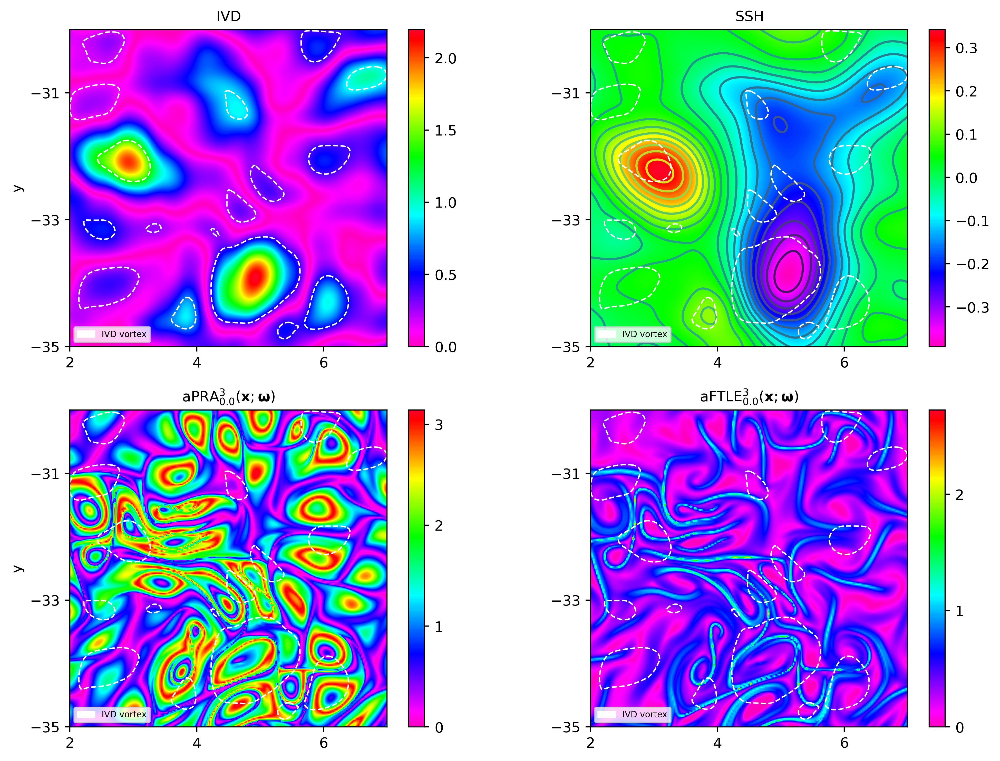

In [21]:
################################################ PLOT RESULTS ################################################

SSH_domain = Interpolant_SSH[0](Y_domain.ravel(), X_domain.ravel(), grid = False).reshape(Ny, Nx)

# Figure/Axis
fig, ax = plt.subplots(nrows=2, ncols=2, dpi = 400, figsize=(12, 9))

# Contourplot of IVD over meshgrid of initial conditions
cax = ax[0,0].tricontourf(x0, y0, IVD.ravel(), cmap = cmapToUse, levels = 600)
# Colorbar
cbar = fig.colorbar(cax, ax = ax[0,0], ticks = np.arange(0, 3, .5))

# Contourplot of aPRA_0^0.05 over meshgrid of initial conditions
cax = ax[0,1].tricontourf(x0, y0, SSH_domain.ravel(), cmap = cmapToUse, levels = 600)
ax[0,1].tricontour(x0, y0, SSH_domain.ravel(), levels = 20)
#ax[0,1].quiver(X, Y, U[:,:,0], V[:,:,0], color = "k", scale = 3)
ax[0,1].set_xlim([xmin, xmax])
ax[0,1].set_ylim([ymin, ymax])
# Colorbar
cbar = fig.colorbar(cax, ax = ax[0,1], ticks = np.arange(-.4, .4, .1))

# Contourplot of aPRA_0^2 over meshgrid of initial conditions
cax = ax[1,0].tricontourf(x0, y0, aPRA[2,:], cmap = cmapToUse, levels = 600)
# Colorbar
cbar = fig.colorbar(cax, ax = ax[1,0], ticks = np.linspace(0, 3, 4))

# Contourplot of aFTLE_0^2 over meshgrid of initial conditions
cax = ax[1,1].tricontourf(x0, y0, aFTLE[2,:], cmap = cmapToUse, levels = 600)
# Colorbar
cbar = fig.colorbar(cax, ax = ax[1,1], ticks = np.linspace(0, 4, 5))

IVD_vortices = mpatches.Patch(color='w', label='IVD vortex')

for i in range(ax.shape[0]):
    for j in range(ax.shape[1]):
        ax[i,j].set_xticks(np.arange(xmin, xmax+.1, 2))
        ax[i,j].set_yticks(np.arange(ymin, ymax+.1, 2))
        ax[i,j].set_aspect("equal")
        # plot vortex boundaries
        for v in vortex:
            ax[i,j].plot(v[0], v[1], c = "w", linestyle = "dashed", linewidth = 1)
        
        ax[i,j].set_aspect("equal")
        ax[i,j].legend(handles=[IVD_vortices], fontsize = 6,  loc = "lower left")

# Axis Labels
ax[0,0].set_ylabel("y", fontsize = 10)
ax[1,0].set_ylabel("y", fontsize = 10)

ax[0,0].set_title(r'$ \mathrm{IVD}$', fontsize = 10)
ax[0,1].set_title(r'$ \mathrm{SSH}$', fontsize = 10)
ax[1,0].set_title(r'$ \mathrm{aPRA}$'+f'$_{{{np.around(s_dummy[0], 2)}}}^{{{np.around(s[2], 2)}}}$'+r'($\mathbf{x}; \mathbf{\omega}$)', fontsize = 10)
ax[1,1].set_title(r'$ \mathrm{aFTLE}$'+f'$_{{{np.around(s_dummy[0], 2)}}}^{{{np.around(s[2], 2)}}}$'+r'($\mathbf{x}; \mathbf{\omega}$)', fontsize = 10)

plt.show()

# References

[1] Haller, G., Katsanoulis, S., Holzner, M., Frohnapfel, B., & Gatti, D. (2020). Objective barriers to the transport of dynamically active vector fields. Journal of Fluid Mechanics, 905.

[2] Notebook 9.7.1. in "Transport Barriers and Coherent Structures in Flow Data" by Prof. George Haller.